# 03_1_AT2_Vim_Scoring
## Xiaonan Wang
## 18Sep2026

In [1]:
#%matplotlib nbagg
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
from os import listdir
from os.path import isfile, join
import re
import anndata
# import scvi

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', '#a1a1ce', 'purple', '#301934']) 
sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)

In [2]:
import sys

project_dir = "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data/Xu_NC2026_human/analysis_v1"

if project_dir not in sys.path:
    sys.path.append(project_dir)

import source

In [ ]:
sc.logging.print_header()

In [3]:
datadir = "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data/Xu_NC2026_human/data/Spatial/"
outdir = "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data/Xu_NC2026_human/analysis_v1/write_all/"

## Step0 - Read In Files

In [4]:
x_epi = sc.read_h5ad(datadir + "epithelial_xenium.h5ad")

In [14]:
x_epi

AnnData object with n_obs × n_vars = 53915 × 389
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'donor_id', 'core_id', 'tma_id', 'age', 'pmi', 'sex', 'tissue_annotation', 'tech', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'celltype_final', 'age_category'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'features'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
AT2 = x_epi[x_epi.obs['celltype_final'] == "AT2"].copy()

In [15]:
AT2

AnnData object with n_obs × n_vars = 21495 × 389
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'donor_id', 'core_id', 'tma_id', 'age', 'pmi', 'sex', 'tissue_annotation', 'tech', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'celltype_final', 'age_category'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'features'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Step1 - Map Mouse Genes To Human Orthologs

In [6]:
AT2_DEres = pd.read_csv("/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/Inhouse_Data/XTY_10X_Lung_mouse/AT/analysis_v1/Step05_AT2_1_vs_AT2_2_LIMMA.csv")

In [7]:
AT2_DEres.head()

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn
0,Aox3,-1.441133,0.745334,-73.037513,0.0,0.0,1745.054098,0.051984,0.913587,AT2-2
1,Nbeal1,-0.877858,0.570283,-46.155662,0.0,0.0,861.787747,0.077778,0.887559,AT2-2
2,Sgpp2,-0.683581,0.352517,-47.863150,0.0,0.0,915.446217,0.026587,0.715773,AT2-2
3,Col4a3,-0.676321,0.337339,-44.867813,0.0,0.0,821.773226,0.017857,0.669443,AT2-2
4,Slco4c1,-1.067588,0.535069,-69.800660,0.0,0.0,1637.268449,0.031746,0.882353,AT2-2


In [7]:
ortholog_path = (
    "/dssg/home/acct-svetoslav_chakarov/"
    "svetoslav_chakarov/Files/human_mouse_orthologs.csv"
)

human_mouse_orthologs  = pd.read_csv(ortholog_path)

print(human_mouse_orthologs.shape)
display(human_mouse_orthologs.head())

(17177, 3)


,external_gene_name,mmusculus_homolog_associated_gene_name,mmusculus_homolog_orthology_type
0,MT-ND1,mt-Nd1,ortholog_one2one
1,MT-ND2,mt-Nd2,ortholog_one2one
2,MT-CO1,mt-Co1,ortholog_one2one
3,MT-CO2,mt-Co2,ortholog_one2one
4,MT-ATP8,mt-Atp8,ortholog_one2one


In [8]:
AT2_DEgenes = source.add_human_gene_name(
    de_table=AT2_DEres,
    ortholog_table=human_mouse_orthologs,
    mouse_gene_col="Symbol",
    output_col="Human_gene_name",
)

In [11]:
AT2_DEgenes.head()

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn,Human_gene_name,Human_gene_mapping_method
0,Aox3,-1.441133,0.745334,-73.037513,0.0,0.0,1745.054098,0.051984,0.913587,AT2-2,AOX3,uppercase_fallback
1,Nbeal1,-0.877858,0.570283,-46.155662,0.0,0.0,861.787747,0.077778,0.887559,AT2-2,NBEAL1,orthologue_table
2,Sgpp2,-0.683581,0.352517,-47.863150,0.0,0.0,915.446217,0.026587,0.715773,AT2-2,SGPP2,orthologue_table
3,Col4a3,-0.676321,0.337339,-44.867813,0.0,0.0,821.773226,0.017857,0.669443,AT2-2,COL4A3,orthologue_table
4,Slco4c1,-1.067588,0.535069,-69.800660,0.0,0.0,1637.268449,0.031746,0.882353,AT2-2,SLCO4C1,orthologue_table


In [17]:
AT2_DEgenes.loc[AT2_DEgenes['Symbol'] == 'Vim',:]

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn,Human_gene_name,Human_gene_mapping_method
1007,Vim,0.941361,0.814288,27.820357,3.359015e-157,4.072472e-156,347.974734,0.433333,0.373764,AT2-1,VIM,orthologue_table


In [19]:
AT2_DEgenes.loc[AT2_DEgenes['Symbol'] == 'Epcam',:]

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn,Human_gene_name,Human_gene_mapping_method
266,Epcam,-1.007439,0.645406,-52.249675,0.0,0.0,1055.951522,0.092063,0.902134,AT2-2,EPCAM,orthologue_table


## Step2 - Vim Score - All Sig

In [9]:
VIMhi_sig = AT2_DEgenes.loc[
    (AT2_DEgenes["HigherIn"] == "AT2-1")
    & (AT2_DEgenes["Human_gene_name"].isin(AT2.var_names))
    & (AT2_DEgenes["adj.P.Val"] < 0.1)
    & (AT2_DEgenes["logFC"] > 0.25),
    :
]
display(VIMhi_sig)

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn,Human_gene_name,Human_gene_mapping_method
810,Tyrobp,1.010686,0.746690,29.995485,3.270551e-180,4.928410e-179,400.896907,0.413492,0.258719,AT2-1,TYROBP,orthologue_table
1492,Cxcl2,0.801799,0.723028,23.689681,6.009530e-117,4.919120e-116,255.429911,0.369444,0.374284,AT2-1,CXCL2,uppercase_fallback
2060,Il1b,0.593808,0.474098,20.259344,2.287294e-87,1.356285e-86,187.458830,0.261508,0.214472,AT2-1,IL1B,orthologue_table
2312,Pim1,0.578524,0.565510,19.120463,2.187393e-78,1.155734e-77,166.833038,0.297619,0.321707,AT2-1,PIM1,orthologue_table
2452,Mpeg1,0.469297,0.348349,18.489667,1.337657e-73,6.664293e-73,155.842737,0.209127,0.131182,AT2-1,MPEG1,uppercase_fallback
2539,Sirpa,0.444909,0.316821,18.147884,4.595898e-71,2.211278e-70,150.020521,0.192857,0.104112,AT2-1,SIRPA,uppercase_fallback
2638,Plaur,0.465018,0.381491,17.754646,3.388138e-68,1.569020e-67,143.437892,0.219841,0.179594,AT2-1,PLAUR,orthologue_table
3334,Fn1,0.369820,0.294025,15.569206,2.922865e-53,1.071074e-52,109.169215,0.171429,0.128579,AT2-1,FN1,orthologue_table
3499,Syk,0.311770,0.208559,15.047069,5.990144e-50,2.091587e-49,101.575940,0.131349,0.053097,AT2-1,SYK,orthologue_table
3630,Cd44,0.512889,1.066366,14.665702,1.351668e-47,4.549363e-47,96.181062,0.455952,0.767309,AT2-1,CD44,orthologue_table


In [10]:
VIMhi_genes = VIMhi_sig['Symbol'].values

In [48]:
VIMhi_genes

array(['Tyrobp', 'Cxcl2', 'Il1b', 'Pim1', 'Mpeg1', 'Sirpa', 'Plaur',
       'Fn1', 'Syk', 'Cd44'], dtype=object)

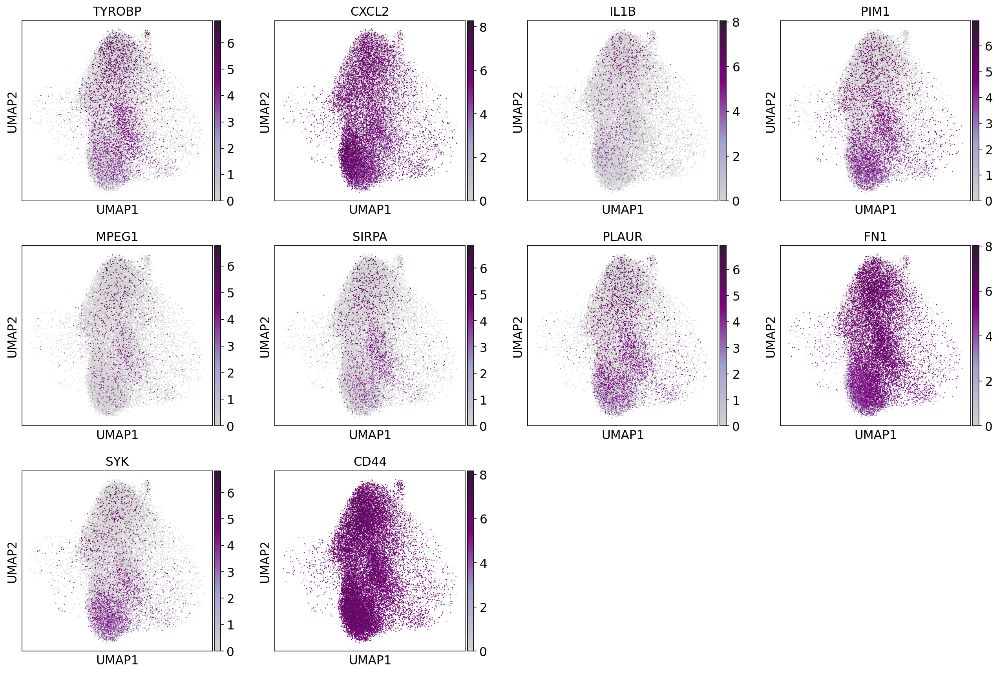

In [24]:
sc.pl.umap(AT2, color=VIMhi_sig['Human_gene_name'], color_map=cmap, use_raw=False)

In [11]:
VIMlo_sig = AT2_DEgenes.loc[
    (AT2_DEgenes["HigherIn"] == "AT2-2")
    & (AT2_DEgenes["Human_gene_name"].isin(AT2.var_names))
    & (AT2_DEgenes["adj.P.Val"] < 0.1)
    & (AT2_DEgenes["logFC"] < -0.25),
    :
]
display(VIMlo_sig)

,Symbol,logFC,AveExpr,t,P.Value,adj.P.Val,B,Pct_AT2_1,Pct_AT2_2,HigherIn,Human_gene_name,Human_gene_mapping_method
15,Atp1b1,-1.935605,1.222000,-83.235309,0.000000e+00,0.000000e+00,2081.063365,0.157143,0.986986,AT2-2,ATP1B1,orthologue_table
21,Dpp4,-0.935653,0.547582,-53.499038,0.000000e+00,0.000000e+00,1096.545577,0.060714,0.883915,AT2-2,DPP4,orthologue_table
28,Ehf,-0.644158,0.323911,-48.086533,0.000000e+00,0.000000e+00,922.513508,0.020635,0.699636,AT2-2,EHF,orthologue_table
51,Muc1,-0.902036,0.571157,-49.769067,0.000000e+00,0.000000e+00,976.067256,0.081349,0.875586,AT2-2,MUC1,uppercase_fallback
98,Baiap2l1,-1.206182,0.603070,-75.832761,0.000000e+00,0.000000e+00,1837.797956,0.036905,0.921395,AT2-2,BAIAP2L1,orthologue_table
99,Hmgb1,-1.277523,1.192721,-45.171462,0.000000e+00,0.000000e+00,831.170297,0.246032,0.967725,AT2-2,HMGB1,uppercase_fallback
102,Ica1,-0.699143,0.369457,-47.543743,0.000000e+00,0.000000e+00,905.359411,0.029762,0.743883,AT2-2,ICA1,orthologue_table
104,Met,-1.011595,0.510190,-69.273399,0.000000e+00,0.000000e+00,1619.684036,0.031349,0.894846,AT2-2,MET,orthologue_table
105,Cftr,-0.640946,0.309824,-41.997341,0.000000e+00,0.000000e+00,734.192132,0.014683,0.606455,AT2-2,CFTR,orthologue_table
141,Cdh1,-1.071259,0.675989,-55.791267,0.000000e+00,0.000000e+00,1171.545085,0.090873,0.928162,AT2-2,CDH1,orthologue_table


In [12]:
VIMlo_genes = VIMlo_sig['Symbol'].values

In [36]:
VIMlo_genes

array(['Atp1b1', 'Dpp4', 'Muc1', 'Baiap2l1', 'Hmgb1', 'Met', 'Cdh1',
       'Fasn', 'Tc2n', 'Sftpd', 'Emp2', 'Etv5', 'App', 'Ager', 'Sfta2',
       'Epcam', 'Icam1', 'Hp', 'Hspa8', 'Cd74'], dtype=object)

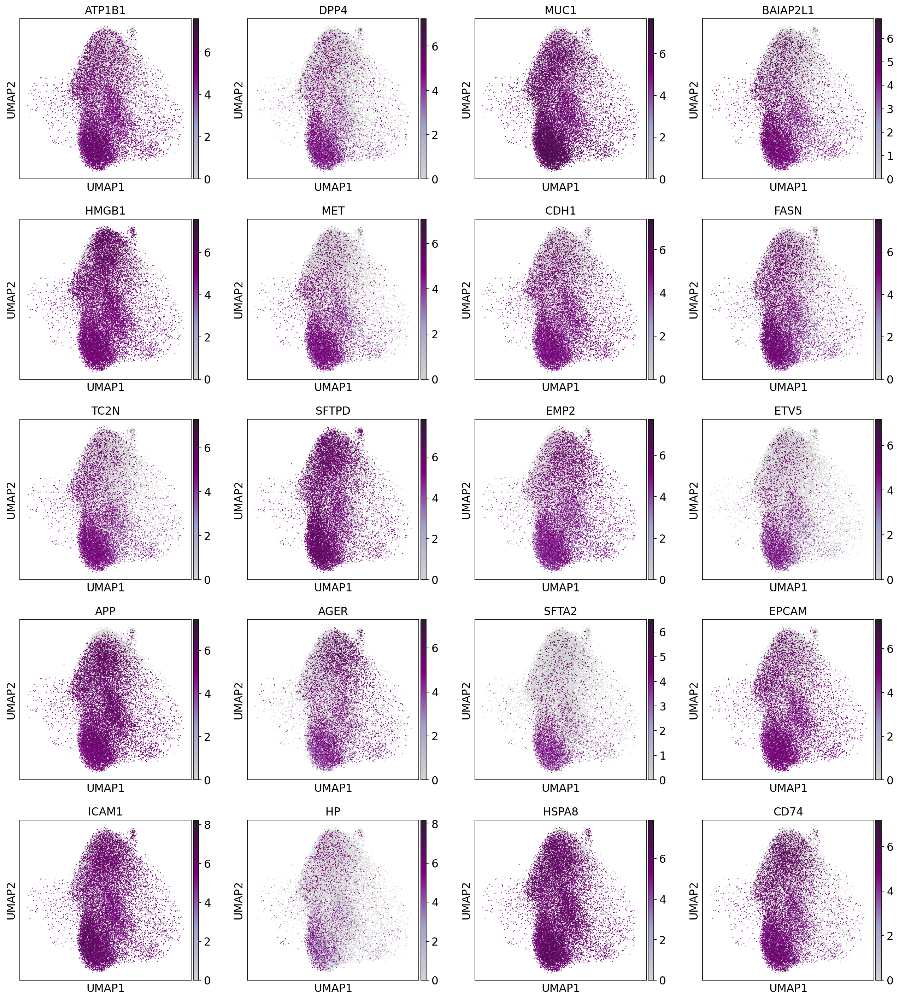

In [37]:
sc.pl.umap(AT2, color=VIMlo_sig['Human_gene_name'], color_map=cmap, use_raw=False)

In [14]:
AT2 = score_and_assign_two_signatures(
    adata=AT2,

    gene_list_1=VIMhi_sig['Human_gene_name'],
    gene_list_2=VIMlo_sig['Human_gene_name'],

    score_name_1="AT2_VIMhi_score",
    score_name_2="AT2_VIMlo_score",
    output_col="AT2_VIM_group",

    label_1="VIMhi",
    label_2="VIMlo",
    ambiguous_label="Ambiguous",

    use_raw=True,
    layer=None,

    scale=True,
    max_value=10,
    zero_center=True,

    ambiguous=False,
    ambiguous_threshold=0,

    ctrl_size=50,
    n_bins=25,
    random_state=0,

    make_categorical=True,
    verbose=True,
)

Expression source: adata.raw

AT2_VIMhi_score: 10/10 genes found

AT2_VIMlo_score: 57/57 genes found

Scaling expression (max_value=10, zero_center=True)...
computing score 'AT2_VIMhi_score'
    finished: added
    'AT2_VIMhi_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'AT2_VIMlo_score'


/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/miniconda3/envs/scrna/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished: added
    'AT2_VIMlo_score', score of gene set (adata.obs).
    221 total control genes are used. (0:00:00)

Score summary:
       AT2_VIMhi_score  AT2_VIMlo_score
count     21495.000000     21495.000000
mean          0.000057         0.002661
std           0.313652         0.329326
min          -1.292934        -0.918865
25%          -0.184035        -0.208309
50%          -0.078769        -0.102488
75%           0.107499         0.117320
max           4.452846         2.382405

AT2_VIM_group:
                   n    percent
AT2_VIM_group                  
VIMhi          11766  54.738311
VIMlo           9729  45.261689


In [15]:
AT2.obs['AT2_VIM_score'] = AT2.obs['AT2_VIMhi_score'] -  AT2.obs['AT2_VIMlo_score']

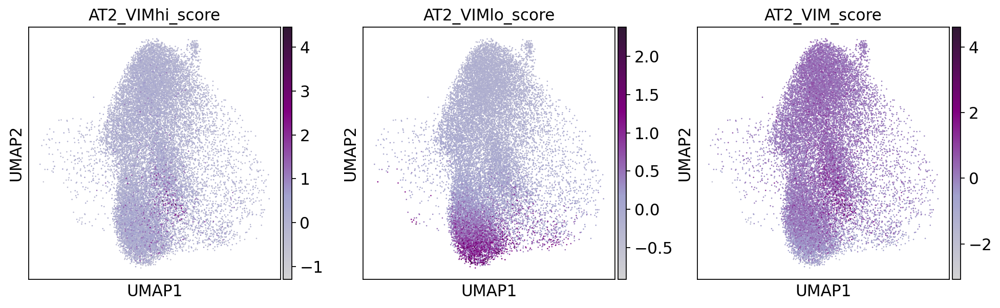

In [58]:
sc.pl.umap(AT2, color=['AT2_VIMhi_score', 'AT2_VIMlo_score', 'AT2_VIM_score'], color_map=cmap)

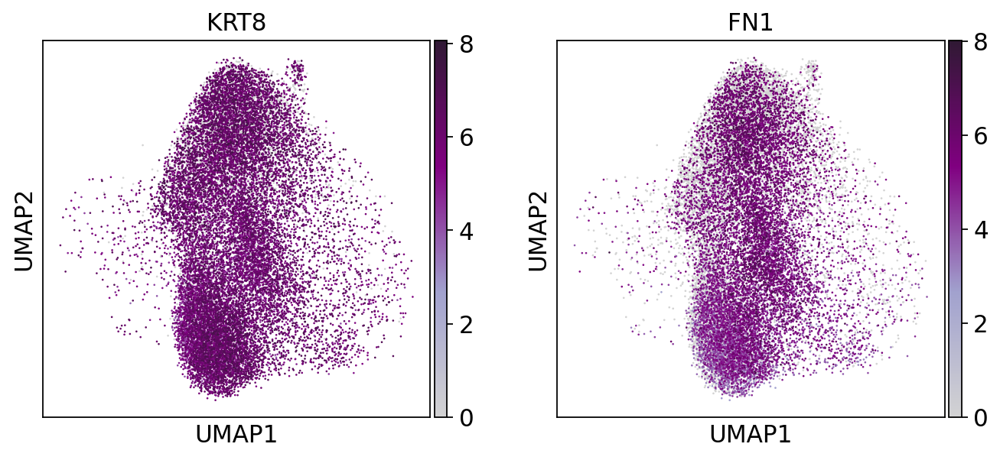

In [17]:
sc.pl.umap(AT2, color=['KRT8', 'FN1'], color_map=cmap, use_raw=False)

In [6]:
palette = {
        "VIMhi": "#E69A6B",
        "VIMlo": "#7FB9A8",
}

In [8]:
AT2.uns['AT2_VIM_group_colors'] = [palette[x] for x in AT2.obs['AT2_VIM_group'].cat.categories]

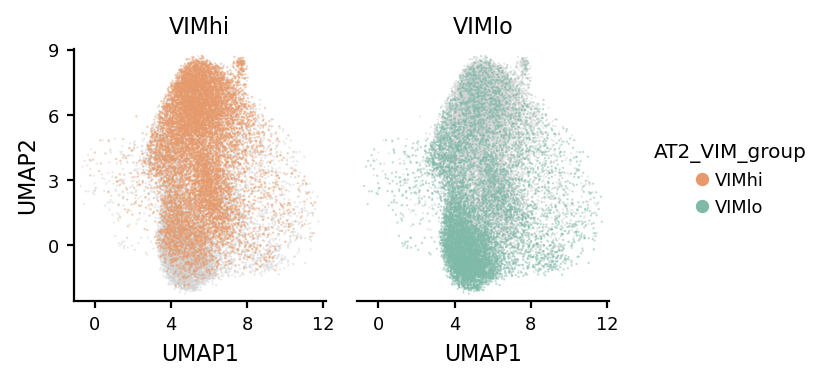

In [11]:
fig, axes = plot_anndata_group_umap(
    AT2,
    group_col="AT2_VIM_group",
    split_by="AT2_VIM_group",
    split_categories=[
        "VIMhi",
        "VIMlo"
    ],
    point_size=1,
    point_alpha=0.5,
    width_cm=4,
    height_cm=4,
    top_cm=0.9,
    shared_limits=True,
    rasterized=True,
    legend_ncol=1,
    legend_width_cm=4.0
)

In [18]:
plt.rcParams["axes.grid"] = False

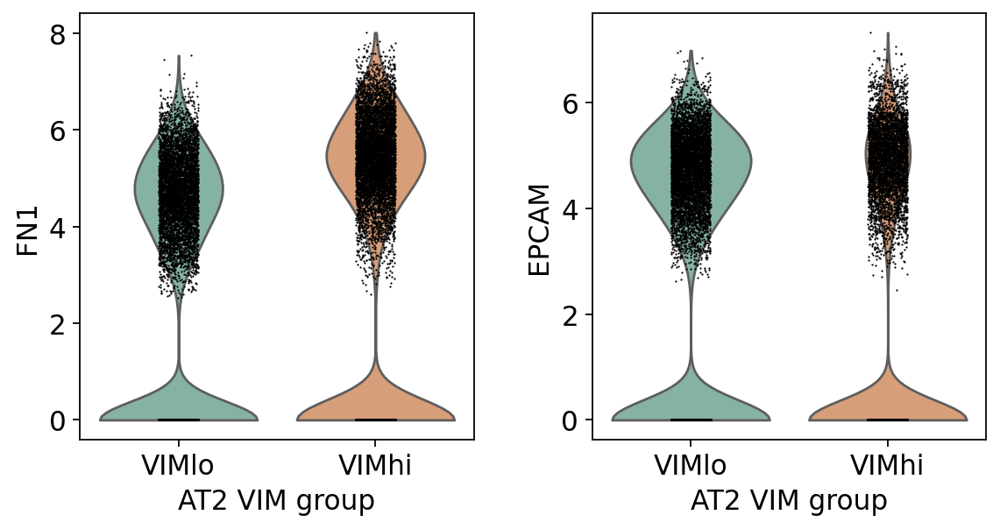

In [21]:
sc.pl.violin(
    AT2,
    keys=["FN1", "EPCAM"],
    groupby="AT2_VIM_group",
    order=["VIMlo", "VIMhi"],
    stripplot=True,
    multi_panel=True,
    use_raw=False,
)

In [19]:
vim_detection = source.gene_detection_by_group(
    AT2,
    genes=["FN1", "EPCAM"],
    groupby="AT2_VIM_group",
)

display(vim_detection)

,group,pct_expressing,gene
0,VIMhi,57.334693,FN1
1,VIMhi,37.395886,EPCAM
2,VIMlo,57.631822,FN1
3,VIMlo,62.051598,EPCAM


In [22]:
AT2.write(outdir + 'AT2_updated.h5ad')

In [5]:
AT2 = sc.read_h5ad(outdir + 'AT2_updated.h5ad')